<a href="https://colab.research.google.com/github/onni-Q/lecture_notebooks/blob/main/Week5_Lecture.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Keep cell -> only run once, then comment all

!pip install pytesseract > /dev/null
!pip install --upgrade easyocr

## Do not run these unless you are having trouble loading models in Part 3
# !apt install tesseract-ocr -y > /dev/null
# !pip install opencv-python-headless > /dev/null
# !pip install opencv-python-headless > /dev/null
# !pip install matplotlib > /dev/null
# # !pip install --upgrade torch torchvision torchaudio



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.7/899.7 MB 666.5 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 111.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.2/288.2 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.3/322.3 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.3/39.3 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Import required libraries

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import cv2
import torch
from transformers import AutoImageProcessor, AutoModelForImageClassification, pipeline
import pytesseract
import easyocr

# Get the test images for the week
if not(os.path.exists('test_data')):
  print('Downloading week 5 images \n')
  !mkdir test_data
  !wget https://github.com/delfimpandiani/cultural-data-analysis-CDAI/raw/refs/heads/main/week5_imgs.zip
  !unzip -q week5_imgs -d test_data
  !rm week5_imgs.zip

# Define image paths in a single dictionary to use throughout the notebook
image_paths = {
    "archival_photo": "/content/test_data/week5_imgs/lecture_imgs/archive2.png",
    "meme1": "/content/test_data/week5_imgs/lecture_imgs/meme1.png",
    "meme2": "/content/test_data/week5_imgs/lecture_imgs/meme2.png",
    "meme3": "/content/test_data/week5_imgs/lecture_imgs/meme3.png"
}

# Week 5 — Image Processing and Computer Vision

In this lecture, we will explore **how computers "see" images** and how **meaningful information** can be extracted from them.

We will also consider the **ethical and cultural implications** of using computer vision in social and cultural data analysis.

We will cover:
- How digital images are represented numerically
- Basic image processing operations (loading, displaying, filtering)
- Classical computer vision tasks: contours, features, OCR
- Modern deep learning approaches: CNNs, ViTs, object detection
- Ethical and cultural implications of computer vision

> 🧠 **Key Question:** How do computers *see* culture — and what do they miss?



## Part 1: How Computers "See"

Before we can analyze or interpret images computationally, we need to ask:  
**what is an image to a computer?**

When we, as humans, look at an image, we immediately perceive *meaning* — faces, emotions, symbols, context.  
Our visual perception is shaped by complex biological and cultural processes: depth perception, Gestalt grouping, pattern recognition, and learned associations.

A computer, by contrast, 'sees' only **arrays of numbers**.  
Each pixel in a digital image corresponds to a point in a grid, with values describing its color intensity.  
In an RGB (Red–Green–Blue) image, every pixel has three numerical values between 0 and 255, representing the brightness of each color channel.


### 1.1 Image Creation/Loading




#### Creating an image

Let’s make this idea concrete by creating an image from scratch using just numbers.
We'll create a 100x100 pixel image as a NumPy array with 3 color channels (RGB).
Initialize it with zeros using `np.zeros((100, 100, 3), dtype=np.uint8)`.
Then fill the left half (all rows, columns 0 to 50) with pure red: `[255, 0, 0]`.
Fill the right half (all rows, columns 50 to 100) with pure green: `[0, 255, 0]`.
Finally, display the image using `plt.imshow()`, add a title, turn off the axis, and show it.


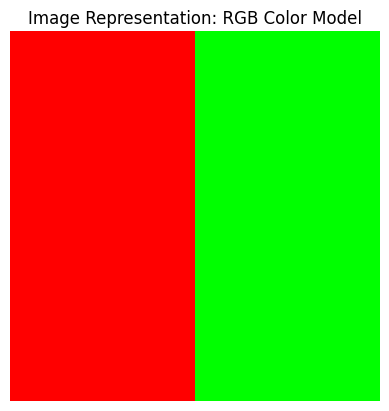

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

image = #YOUR CODE HERE
image[:, :50] = #YOUR CODE HERE
image[:, 50:] = #YOUR CODE HERE

#YOUR CODE HERE
#YOUR CODE HERE
#YOUR CODE HERE
plt.show()


What you see here is a computer-generated image made of **10,000 pixels** arranged in a 100×100 grid.

Each half is filled with a constant RGB value — pure red on the left, pure green on the right.  
From the computer’s point of view, this is simply a matrix of numbers like:

```
[ [ [255, 0, 0], [255, 0, 0], ... ],
[ [ 0,255, 0], [ 0,255, 0], ... ] ]
```
Next, we’ll load and inspect "real" images to see how this numerical representation looks in practice.



#### Loading and Displaying Images

Now that we understand that computers represent images as numerical arrays,  
let’s see **how we can load and visualize a real image** using different tools.

There are several Python libraries for handling images — each with its own philosophy and conventions:

- 🖼 **Pillow (PIL)** — a user-friendly library for opening, manipulating, and saving images.
- ⚙️ **OpenCV** — a computer vision toolkit optimized for performance and analysis.
- 📊 **Matplotlib** — primarily a plotting library, but also capable of displaying images.

We’ll use all three to load the same image and compare the results.
First, let's load an image using Pillow.
Use `Image.open()` with the archival_photo path from our `image_paths` dictionary.
Store it in a variable called `pil_image`.
Then display it using `plt.imshow()`, add a title "Image Loaded with Pillow (RGB)", turn off the axis, and show it.




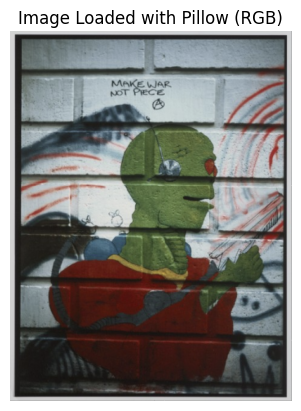

In [ ]:
# Load image using Pillow
pil_image = #YOUR CODE HERE

# Display using Matplotlib
#YOUR CODE HERE
#YOUR CODE HERE
#YOUR CODE HERE
#YOUR CODE HERE


**Pillow** loads images in the standard **RGB color mode**, where colors appear natural to us.  
The result above should look exactly as you’d expect — the same colors as the original file.

Next, let’s see how **OpenCV** interprets the same image.

Load the same archival photo using OpenCV's `cv2.imread()` function.
Store it in a variable called `cv_image`.
Display it directly with `plt.imshow()` and title it "Image Loaded with OpenCV (BGR order)".
You'll notice the colors look wrong! This is because OpenCV loads images in BGR order, not RGB.

To fix this, convert the color from BGR to RGB using `cv2.cvtColor()` with the flag `cv2.COLOR_BGR2RGB`.
Store this in `cv_image_rgb` and display it with the title "Image Loaded with OpenCV (Converted to RGB)".


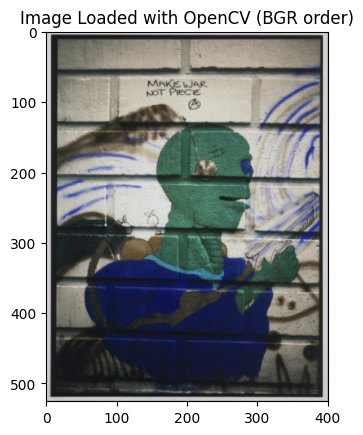

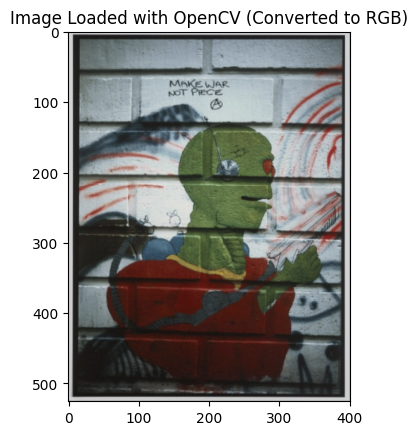

In [ ]:

# Load image using OpenCV
cv_image = #YOUR CODE HERE


# OpenCV loads images in BGR order, not RGB – so colors look wrong if we display them directly
plt.imshow(cv_image)
plt.title("Image Loaded with OpenCV (BGR order)")
plt.axis('on')
plt.show()

# Fixing the color channel order
cv_image_rgb = #YOUR CODE HERE
plt.imshow(cv_image_rgb)
plt.title("Image Loaded with OpenCV (Converted to RGB)")
plt.axis('on')
plt.show()

Notice the difference:

- The **first** image (direct OpenCV display) looks “off” — reds and blues are swapped.  
- The **second** image (after converting `BGR → RGB`) matches the Pillow version.

This is a subtle but important lesson:  
> Different libraries *encode and interpret pixel values differently.*

When working with images computationally — especially for tasks like feature extraction or model training —  it’s essential to keep track of **which color convention** you are using.



Finally, let’s confirm that both libraries see the same *data structure* under the hood. Print the type of `pil_image` and `cv_image`.
Convert the Pillow image to a NumPy array using `np.array()` and store it in `np_from_pil`.
Print the shape of both NumPy arrays (from Pillow and from OpenCV).


In [ ]:
print("Pillow image type:", #YOUR CODE HERE)
print("OpenCV image type:", #YOUR CODE HERE)

# Convert Pillow image to NumPy array
np_from_pil = #YOUR CODE HERE
print("NumPy array shape from Pillow:", #YOUR CODE HERE)
print("NumPy array shape from OpenCV:", #YOUR CODE HERE)



Let’s unpack this.

- **Pillow image type:**  
  Pillow keeps its own object type (`PIL.PngImageFile`) that stores metadata about the image — such as its format (PNG), color mode (RGBA), and compression details.  
  When we convert it to a NumPy array, we get a **4-channel image**:  
  three color channels (Red, Green, Blue) **plus one extra channel for transparency (Alpha)**.  
  That’s why its shape ends with `4`.

- **OpenCV image type:**  
  OpenCV skips the metadata abstraction and works directly with **NumPy arrays**.  
  It loads only the visible color channels (Blue, Green, Red) — no transparency —  
  which is why the shape ends with `3`.


> A missing alpha channel or a swapped color order can subtly affect downstream analysis — especially if we’re quantifying color, texture, or brightness. So always check how your tools represent images before interpreting the numbers they produce.




#### Reading and Creating from Pixel Values

Now that we can load and display an image, let’s zoom in — literally — on what it’s *made of*. In this section, we’ll:

1. Inspect the **color values** of three specific pixels — the first, central, and last ones.  
2. Use those pixel values to **create new mini-images** filled with each color.

This helps us understand that what we perceive as an “image” is in fact just **structured numerical data**, and that each pixel can be manipulated or analyzed independently.

Start by setting `img = cv_image`.
Get the image dimensions using `img.shape` and unpack height, width, and channels (use `_` as a variable name for channels).
Print the dimensions in a formatted string.

In [ ]:
#YOUR CODE HERE

# Get image dimensions
#YOUR CODE HERE
#YOUR CODE HERE


Then extract the first pixel (top-left corner) at position [0, 0].
OpenCV stores it as BGR, so unpack as `b1, g1, r1`.
Convert to RGB order by creating a tuple `first_pixel_rgb = (r1, g1, b1)`.
Print this RGB value.

For the central pixel, calculate the center position as `height // 2, width // 2`.
Extract the pixel value at that position, unpack as BGR, convert to RGB, and print.

For the last pixel (bottom-right corner), extract at position `[height - 1, width - 1]`.
Unpack, convert to RGB, and print.

In [ ]:
# --- 1. First pixel (top-left corner) ---
b1, g1, r1 = #YOUR CODE HERE
first_pixel_rgb = #YOUR CODE HERE
print("RGB color of the first pixel:", first_pixel_rgb)

# --- 2. Central pixel ---
center_y, center_x = #YOUR CODE HERE
b2, g2, r2 = #YOUR CODE HERE
central_pixel_rgb = (r2, g2, b2)
print("RGB color of the central pixel:", central_pixel_rgb)

# --- 3. Last pixel (bottom-right corner) ---
b3, g3, r3 = #YOUR CODE HERE
last_pixel_rgb = #YOUR CODE HERE
print("RGB color of the last pixel:", last_pixel_rgb)

SyntaxError: invalid syntax (ipython-input-2775741061.py, line 2)

Now create three 100×100 color squares using `np.full()`:
- For each pixel color, create an array of shape (100, 100, 3) filled with that RGB value.
- Use `dtype=np.uint8`.

Finally, display all four images side by side using `plt.subplots(1, 4)`:
- Original image (convert from BGR to RGB first)
- First pixel color square
- Central pixel color square  
- Last pixel color square

Add titles to each subplot, turn off axes, and use `plt.tight_layout()`.

In [ ]:
# Create 100×100 color squares for each pixel
square_first = #YOUR CODE HERE
square_central = #YOUR CODE HERE
square_last = #YOUR CODE HERE

# Display all three colors next to the original image
fig, axes = plt.subplots(1, 4, figsize=(14, 4))
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original Image")
axes[1].imshow(square_first)
axes[1].set_title("First Pixel Color")
axes[2].imshow(square_central)
axes[2].set_title("Central Pixel Color")
axes[3].imshow(square_last)
axes[3].set_title("Last Pixel Color")

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

### 1.2 — Image Manipulation and Transformation

Now that we can load and represent images as arrays, let’s explore how to **manipulate** them — both visually and numerically.

In cultural data analysis, image transformations are not just technical steps.  They are interpretive operations that can **emphasize**, **filter**, or **erase** visual information — raising questions about what is made *visible* or *invisible* by computational processing.

Let’s start with some basic operations: resizing, cropping, and grayscale conversion.


#### Basic Manipulation (Resizing and Cropping) with Pillow

Here, we use **Pillow**’s built-in `.resize()` and `.crop()` methods.  

- `resize()` rescales the image to a given width and height (in pixels).  
- `crop()` takes a bounding box (`left, top, right, bottom`) and cuts out that region.

These are simple but crucial operations when working with large image datasets —  for example, when you want to standardize images for input into a machine learning model, or focus on a specific visual element for analysis.

Resize the `pil_image` to 200×200 pixels using `.resize((200, 200))`.

For cropping, first get the image dimensions using `pil_image.size` (which returns width, height).
Calculate the crop box to get the central region:
- left = width // 4
- top = height // 4  
- right = left + width // 2
- bottom = top + height // 2

Crop the image using `.crop((left, top, right, bottom))`.

Display all three images side by side using subplots: original, resized, and cropped.
Add appropriate titles and turn off axes.


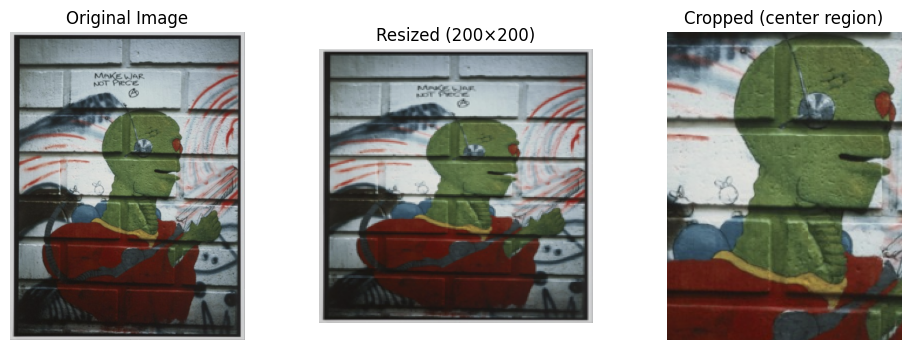

In [ ]:
from PIL import Image

# Resize the image to smaller dimensions
resized_img = #YOUR CODE HERE

# Crop the central region of the image
width, height = #YOUR CODE HERE
left = #YOUR CODE HERE
top = #YOUR CODE HERE
right = #YOUR CODE HERE
bottom = #YOUR CODE HERE
cropped_img = #YOUR CODE HERE

# Display results
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(pil_image)
axes[0].set_title("Original Image")
axes[1].imshow(resized_img)
axes[1].set_title("Resized (200×200)")
axes[2].imshow(cropped_img)
axes[2].set_title("Cropped (center region)")

for ax in axes:
    ax.axis('off')
plt.show()


When we crop an image in Pillow, we have to tell the computer **exactly which rectangular region** we want to keep. The command:

```python
cropped_img = pil_image.crop((left, top, right, bottom))
```
takes a tuple of four pixel coordinates:
- left: the x-coordinate of the left edge of the crop box
- top: the y-coordinate of the top edge
- right: the x-coordinate of the right edge
- bottom: the y-coordinate of the bottom edge

So, (left, top) marks the upper-left corner, and (right, bottom) marks the lower-right corner of the region you want to extract. This coordinate system starts from the top-left corner of the image (0, 0), where x increases to the right and y increases downward.


#### Basic Manipulation (Resizing, Cropping, Rotating, Flipping) with OpenCV

Most of the time, basic image operations including resizing, cropping, rotating, and flipping images are very easy to do with OpenCV.

For resizing, use `cv2.resize(cv_image, (200, 200))` to resize to 200×200 pixels.
Display it using matplotlib, remembering to convert BGR to RGB.

For cropping, use array slicing: `cv_image[50:200, 100:300]` to crop rows 50-200 and columns 100-300.
Display the cropped region.

For rotating, use `cv2.rotate()` with the flag `cv2.ROTATE_90_CLOCKWISE`.
Display the rotated image.

For flipping, use `cv2.flip()` with flip code `1` (horizontal flip).
Display the flipped image.

Remember to convert BGR to RGB before displaying each result!

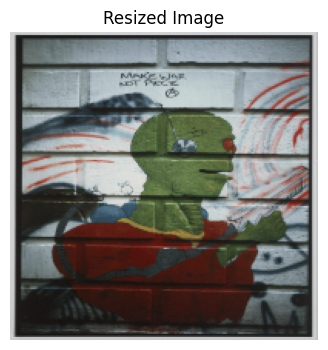

In [ ]:
# Resizing
resized_img = #YOUR CODE HERE

# Display the resized image
plt.figure(figsize=(4, 4))  # Adjust figsize for smaller display
plt.imshow(#YOUR CODE HERE)
plt.title('Resized Image')
plt.axis('off')
plt.show()

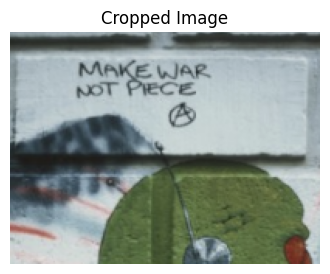

In [ ]:
# Cropping
cropped_img = #YOUR CODE HERE

# Display the cropped image
plt.figure(figsize=(4, 4))  # Adjust figsize for smaller display
plt.imshow(#YOUR CODE HERE)
plt.title('Cropped Image')
plt.axis('off')
plt.show()

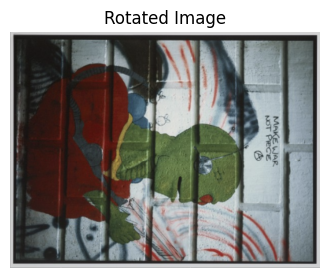

In [ ]:
# Rotating
rotated_img = #YOUR CODE HERE

# Display the rotated image
plt.figure(figsize=(4, 4))  # Adjust figsize for smaller display
plt.imshow(#YOUR CODE HERE)
plt.title('Rotated Image')
plt.axis('off')
plt.show()

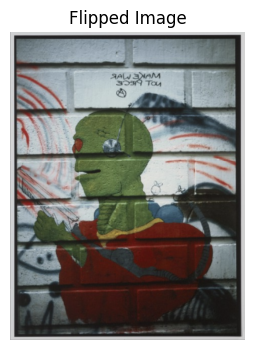

In [ ]:
# Flipping
flipped_img = cv2.flip(cv_image, 1)

# Display the flipped image
plt.figure(figsize=(4, 4))  # Adjust figsize for smaller display
plt.imshow(#YOUR CODE HERE)
plt.title('Flipped Image')
plt.axis('off')
plt.show()

#### Greyscale Conversion

Converting an image to **grayscale** removes all color information, leaving only brightness levels.

Each pixel’s color is replaced by a single intensity value (0 = black, 255 = white). While this simplifies visual data, it also **reduces dimensionality** — which can make pattern recognition easier for algorithms but also strips away cultural context, like symbolic uses of color.

> **Question to reflect on:**  
> What might we lose, analytically or interpretively, when we remove color from an image?


Convert `pil_image` to grayscale using `.convert("L")` and store in `gray_pil`.

Convert `cv_image` to grayscale using `cv2.cvtColor()` with the flag `cv2.COLOR_BGR2GRAY`.
Store in `gray_cv`.

Display both grayscale images side by side using subplots.
Use `cmap="gray"` in the imshow calls to display them properly.
Add titles "Grayscale (Pillow)" and "Grayscale (OpenCV)".


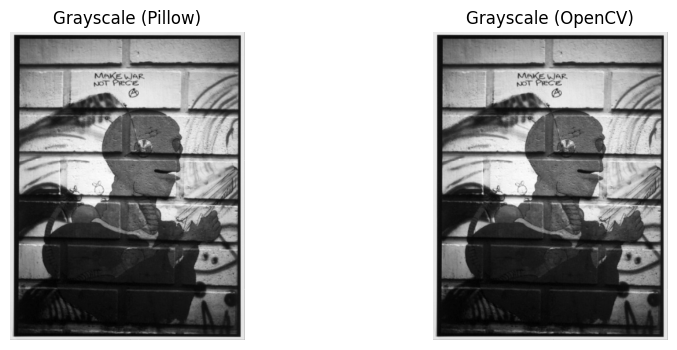

In [ ]:
# Convert to grayscale using Pillow
gray_pil = #YOUR CODE HERE

# Convert to grayscale using OpenCV (for comparison)
gray_cv = #YOUR CODE HERE

# Display results
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(gray_pil, cmap="gray")
axes[0].set_title("Grayscale (Pillow)")
axes[1].imshow(gray_cv, cmap="gray")
axes[1].set_title("Grayscale (OpenCV)")

for ax in axes:
    ax.axis('off')
plt.show()


### 1.3 — Image Filtering (Blurring, Binary, and Edge Detection)

Filtering is one of the most common forms of image processing.  
It allows us to **transform pixel values** to highlight, simplify, or detect patterns in an image.

We’ll look at three classic filters:

1. **Blurring** — smooths the image by averaging neighboring pixels, reducing visual noise.  
   This can make details less sharp but reveal overall structure.  
2. **Binary thresholding** — converts the image into a strictly black-and-white form.  
   Every pixel above a certain brightness becomes white (255), everything below becomes black (0).  
   It’s a first step toward segmentation or detecting shapes.  
3. **Edge detection** — identifies sharp changes in brightness, often corresponding to object boundaries.  
   This technique extracts *structure* rather than *appearance*, showing how computers can “see” forms.

> **Reflection:**  
> Each of these filters emphasizes a different aspect of the same image — color, light, or contour.  
> Which of these representations might be most meaningful in your own cultural analysis?


Apply Gaussian blur using `cv2.GaussianBlur(gray_cv, (9, 9), 0)`.
The (9, 9) is the kernel size and 0 is the sigma value.

Apply binary thresholding using `cv2.threshold(gray_cv, 127, 255, cv2.THRESH_BINARY)`.
This returns two values; use `_, binary = ...` to capture them.

Apply Canny edge detection using `cv2.Canny(gray_cv, 100, 200)`.
The 100 and 200 are the lower and upper thresholds.

Display all four images side by side: original (RGB), blurred, binary, and edges.
Use `cmap='gray'` for the grayscale images.

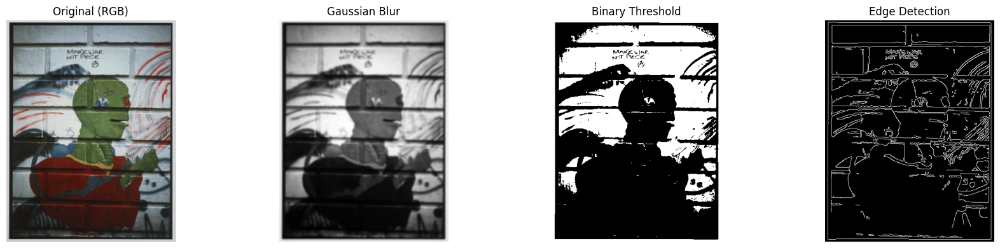

In [ ]:
# 1. Gaussian Blur: smooths out detail and noise
blurred = #YOUR CODE HERE

# 2. Binary Thresholding: everything above 127 becomes white, below becomes black
_, binary = #YOUR CODE HERE

# 3. Edge Detection: find boundaries in the image
edges = #YOUR CODE HERE

# Display the transformations
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
axes[0].imshow(cv_image_rgb)
axes[0].set_title("Original (RGB)")
axes[1].imshow(blurred, cmap='gray')
axes[1].set_title("Gaussian Blur")
axes[2].imshow(binary, cmap='gray')
axes[2].set_title("Binary Threshold")
axes[3].imshow(edges, cmap='gray')
axes[3].set_title("Edge Detection")

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()


## Part 2: From Image Processing to Computer Vision


In the previous part, we learned **how computers "see"** — how digital images are represented as arrays of numbers as color values. In this section, we move one step further into **computer vision (CV)** — the field that enables machines to *interpret* visual content.

Computer vision involves extracting **meaningful information** from images: detecting shapes, edges, objects, text, or even aesthetic features. Unlike traditional image processing (which focuses on manipulation), computer vision focuses on **understanding**.

We'll start with some *classical techniques* that predate deep learning, yet remain highly relevant for analysis — especially in the humanities, where interpretability and simplicity matter.


### 2.1 What is Computer Vision?

Computer Vision (CV) is the discipline that aims to make computers **see and understand images**.  

If image processing is about *enhancing* or *transforming* an image, CV is about *interpreting* it:  
- Detecting the outline of a face  
- Recognizing printed text  
- Identifying a painting style  
- Measuring visual similarity across thousands of artworks  

We'll begin with two classical CV tasks:
- **Contour Detection**: finding the outlines of objects  
- **Feature Detection**: locating important visual points (corners, edges, textures)


### 2.2 Contour detection

Contour detection is one of the earliest computer vision techniques. It identifies **continuous curves** (contours) that bound regions of similar intensity or color.  

In essence, it’s how a computer might start to *trace shapes* the way a human eye does when recognizing forms.

This method is often used to:
- Identify objects or shapes  
- Detect regions of interest in photos or documents  
- Simplify complex images into geometric outlines


First, apply binary thresholding to the grayscale image with threshold value 127.

Find contours using `cv2.findContours()` with parameters:
- The binary image
- `cv2.RETR_TREE` (retrieval mode)
- `cv2.CHAIN_APPROX_SIMPLE` (approximation method)
This returns `contours, _` (we don't need the hierarchy).

Make a copy of the original image: `contour_img = cv_image_rgb.copy()`.
Draw the contours on this copy using `cv2.drawContours()`:
- Pass the image, contours, -1 (draw all), (0, 255, 0) for green color, and 2 for thickness.

Display the result with title "Contour Detection – finding object boundaries".

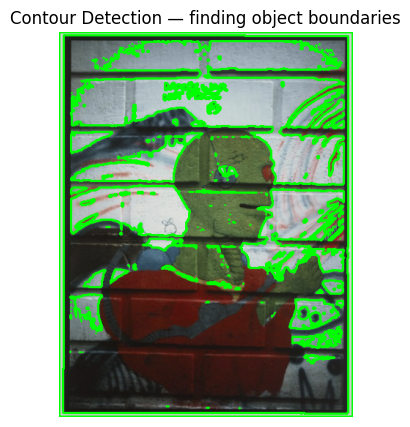

In [ ]:
_, binary =  #YOUR CODE HERE

# Find contours
contours, _ =  #YOUR CODE HERE

# Draw contours on a copy of the original image
contour_img = #YOUR CODE HERE
cv2.drawContours(#YOUR CODE HERE)

# Display
plt.figure(figsize=(10, 5))
plt.imshow(contour_img)
plt.title("Contour Detection — finding object boundaries")
plt.axis('off')
plt.show()


#### Side Bar: Edge Detection vs. Contour Detection

While edge detection and contour detection often *look* similar, they actually describe two different stages of image analysis.

**Edge detection** (e.g., with the Canny operator) identifies places in the image where there is a **sudden change in brightness or color** — in other words, the *boundaries* between regions. It outputs a binary image — white pixels where intensity changes sharply (edges), black elsewhere.

**Contour detection**, on the other hand, takes that binary edge image (or a thresholded image) and tries to **trace the continuous outlines** that connect those edge points together into meaningful shapes. In other words, it transforms a scattered collection of edge pixels into *structured boundaries*. It outputs a list of curves (contours) — essentially a vector representation of object outlines.

In practice, the two are often used together: edge detection to find transitions, and contour detection to describe the geometry of the regions they outline.


### 2.3 Feature Detection

Feature detection identifies **salient points** in an image — areas that stand out because of texture, color change, or structure.

These “keypoints” help computers:
- Match two similar images (e.g., same monument from different angles)
- Track motion or change between frames
- Enable tasks like panorama stitching, facial recognition, or object matching

Unlike edges (which describe *boundaries*), features describe *points of interest* — the anchors for higher-level understanding.

Create a copy of `cv_image_rgb` called `features_img`.
Convert the image to grayscale.

Detect corners using `cv2.goodFeaturesToTrack()` with parameters:
- The grayscale image
- 25 (maximum number of corners)
- 0.01 (quality level)
- 10 (minimum distance between corners)

Convert the detected corners to integers using `np.int32()`.

Loop through each corner and draw a circle on `features_img`:
- Extract x, y coordinates using `.ravel()`
- Use `cv2.circle()` with center (x, y), radius 4, color (255, 0, 0) for red, and -1 to fill

Display the result with title "Feature Detection – identifying corners and key points".

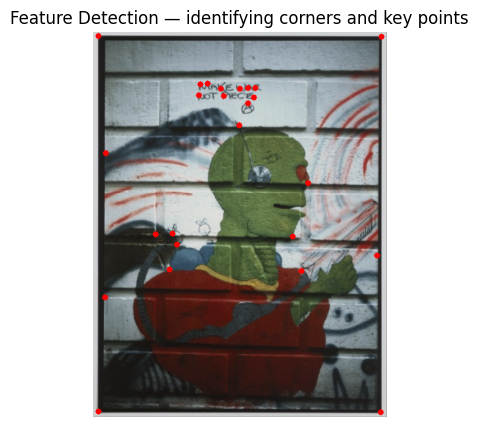

In [ ]:
# Feature Detection (Corners)
features_img = #YOUR CODE HERE
gray = #YOUR CODE HERE

# Detect corners using the Shi-Tomasi method
corners = #YOUR CODE HERE

# Convert the corner coordinates to integers
corners = #YOUR CODE HERE

# Draw circles around each detected feature point
for corner in corners:
    #YOUR CODE HERE

# Display results
plt.figure(figsize=(10, 5))
plt.imshow(features_img)
plt.title("Feature Detection — identifying corners and key points")
plt.axis('off')
plt.show()


### 2.4 Optical Character Recognition (OCR)

Optical Character Recognition (OCR) is the process of automatically detecting and converting text within an image into machine-readable text. Unlike feature or contour detection (which focus on visual patterns such as edges and corners), OCR aims to identify semantic symbols — the actual characters and words.

In cultural data analysis, OCR allows researchers to extract textual information from historical documents, memes, comics, or other multimedia artifacts, enabling computational analysis of language use, discourse, or visual rhetoric. Even when we work with “images,” understanding their text content can reveal social trends, cultural references, and semantic patterns.

#### Approach 1: Tesseract OCR

Tesseract is a classical, open-source OCR engine that uses a combination of traditional image processing and LSTM-based sequence models. The workflow involves:

- Grayscale conversion: removes color information to simplify the image.

- Thresholding: separates text (foreground) from background.

- OCR engine application: Tesseract detects characters and outputs plain text.

⚠️ Tesseract works best on clean, high-contrast images with standard fonts. Let's see it in action...

Loop through all image paths in the `image_paths` dictionary.
For each path:
1. Open the image with Pillow
2. Convert to OpenCV format using `np.array()` and `cv2.cvtColor()` from RGB to BGR
3. Convert to grayscale
4. Apply thresholding with threshold 150 using `cv2.threshold()`
5. Run OCR using `pytesseract.image_to_string()` on the thresholded image
6. Display the preprocessed (thresholded) image
7. Print the extracted text with a separator line

Use formatted strings to show which image is being processed.

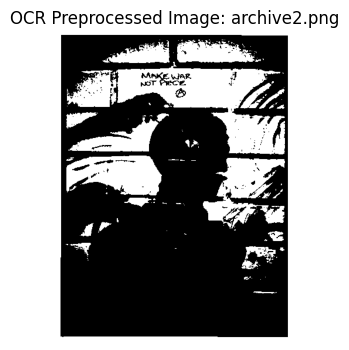

📝 Extracted Text from archive2.png:

 



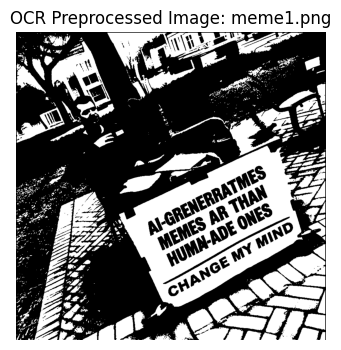

📝 Extracted Text from meme1.png:

 



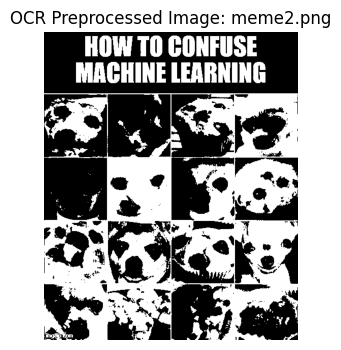

📝 Extracted Text from meme2.png:

PE 3
LTH | 3 LEARNING

 



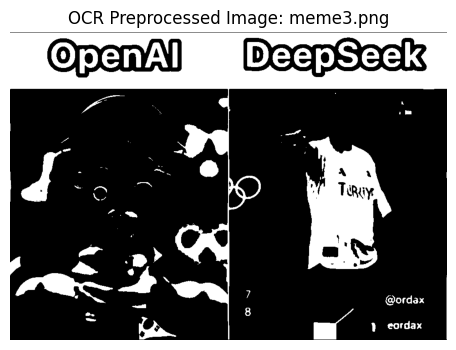

📝 Extracted Text from meme3.png:

8
@
(
RQ |
ol
CT
(
(a)

OpenAl

 



In [ ]:

for path in image_paths.values():
    pil_image = #YOUR CODE HERE

    # Convert to OpenCV format
    cv_image =  #YOUR CODE HERE

    # Convert to grayscale
    gray =  #YOUR CODE HERE

    # Apply thresholding
    _, thresh =  #YOUR CODE HERE

    # Run OCR
    extracted_text =  #YOUR CODE HERE

    # Display preprocessed image
    plt.figure(figsize=(8,4))
    plt.imshow(cv2.cvtColor(thresh, cv2.COLOR_BGR2RGB))
    plt.title(f"OCR Preprocessed Image: {path.split('/')[-1]}")
    plt.axis('off')
    plt.show()

    # Print OCR result
    print(f"📝 Extracted Text from {path.split('/')[-1]}:\n")
    print(extracted_text)
    print("="*50)


#### Approach 2: EasyOCR

EasyOCR is a modern, deep learning-based OCR system. Unlike Tesseract, it detects text regions and recognizes characters using convolutional and recurrent neural networks, making it robust to:

- Colored or textured backgrounds
- Stylized or distorted fonts
- Multiple text regions in a single image

The workflow is similar in principle (detect → recognize) but uses end-to-end neural networks, often resulting in much higher accuracy for real-world images like memes.


Initialize an EasyOCR reader with `easyocr.Reader(['en'])` for English.

Loop through all image paths.
For each path:
1. Open with Pillow and convert to OpenCV BGR format
2. Convert to grayscale
3. Run OCR using `reader.readtext(np.array(gray))` - this returns results with bounding boxes, text, and probabilities
4. For each detected text region, draw a green rectangle and put the text label on the image:
   - Unpack bbox, text, prob from each result
   - Extract the corner coordinates from bbox
   - Use `cv2.rectangle()` and `cv2.putText()` to annotate
5. Display the annotated image
6. Extract and print all detected text

This will show bounding boxes around detected text regions.

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


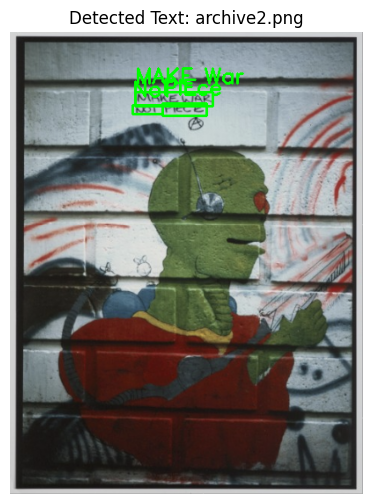

📝 Extracted Text from archive2.png:

MAKE War
PIEce
NoT


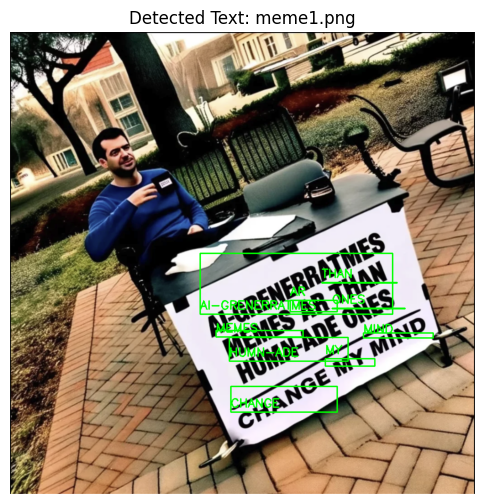

📝 Extracted Text from meme1.png:

AI-GRENERRATMES
THAN
ONES
AR
MEMES
HUMN-ADE
MIND
MY
CHANGE


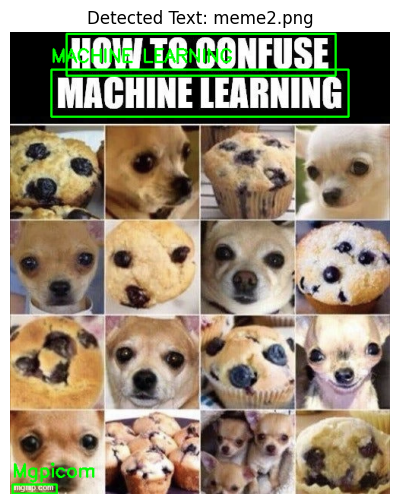

📝 Extracted Text from meme2.png:

HOW TO CONFUSE
MACHINE LEARNING
Mgpicom


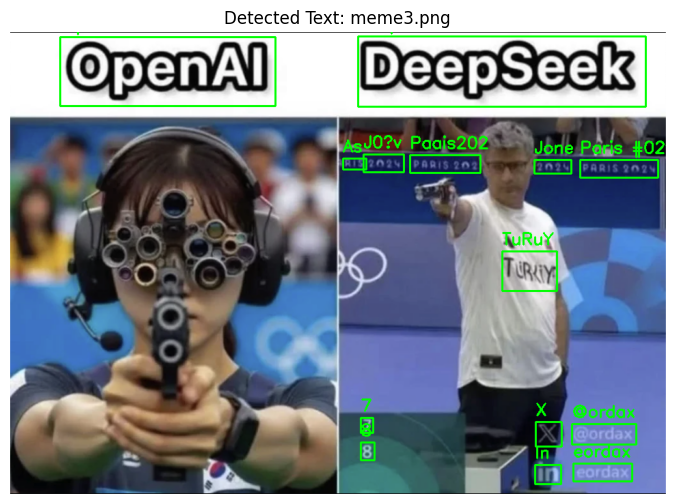

📝 Extracted Text from meme3.png:

@penA
DeepSeeek
As
J0?v
Paais202
Jone
Paris #02v
7
X
@ordax
8
In
eordax
TuRuY


In [ ]:
# Initialize the EasyOCR reader
reader = #YOUR CODE HERE

for path in image_paths.values():
    pil_image = #YOUR CODE HERE

    # Convert to OpenCV format
    cv_image = #YOUR CODE HERE

    # Optional: convert to grayscale (EasyOCR can handle color images too)
    gray = #YOUR CODE HERE

    # Run OCR
    results = #YOUR CODE HERE

    # Draw bounding boxes on detected text
    for (bbox, text, prob) in results:
        (top_left, top_right, bottom_right, bottom_left) = bbox
        top_left = tuple(map(int, top_left))
        bottom_right = tuple(map(int, bottom_right))
        cv2.rectangle(cv_image, top_left, bottom_right, (0, 255, 0), 2)
        cv2.putText(cv_image, text, (top_left[0], top_left[1]-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)

    # Display image with detected text
    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(cv_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Detected Text: {path.split('/')[-1]}")
    plt.axis('off')
    plt.show()

    # Print extracted text
    extracted_text = "\n".join([text for (_, text, _) in results])
    print(f"📝 Extracted Text from {path.split('/')[-1]}:\n")
    print(extracted_text)
    print("="*50)


➡️ **Critical Question:**  
What assumptions about language and readability are embedded in the datasets used to train OCR models? How might this affect non-Western or marginalized writing systems?


## Part 3: Pixels to Perception — CNNs, ViTs, and Modern Computer Vision Tasks

Modern CV systems are powered by deep neural networks that can sometimes *recognize* objects, *interpret* emotions, or even *identify artistic styles*.

in this section, we will cover:

- key architecures - cnns and vit
- loading and using pretrained models
- object detection


### Key architectures

Two key architectures dominate this field:

#### Convolutional Neural Networks (CNNs)
CNNs automatically learn visual patterns (edges, textures, shapes) through multiple layers of convolutions.  Each layer extracts higher-level features: **from pixels → edges → shapes → objects. **
Most modern computer vision systems, from object detection to facial recognition, still rely on CNN backbones. You can think of CNNs as **hierarchical pattern recognizers**.

#### Vision Transformers (ViTs)
ViTs treat an image as a collection of small “patches,” similar to how language models treat words as tokens. Through *self-attention*, they learn relationships across the entire image — capturing global context rather than just local patterns.  ViTs often outperform CNNs on large datasets, especially in capturing abstract relationships and style.


###  Loading and Using Pretrained Models
Before diving into tasks, let’s quickly see how we can *load* and *use* pretrained CNN and ViT models from the Hugging Face ecosystem.

Define two model names:
- CNN model: "microsoft/resnet-50"
- ViT model: "google/vit-base-patch16-224"

Load the image processors for both models using `AutoImageProcessor.from_pretrained()`.
Load the models themselves using `AutoModelForImageClassification.from_pretrained()`.

Print a success message showing which models were loaded.

In [ ]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
from PIL import Image
import requests
import torch

# Load a CNN (ResNet) and a ViT model
cnn_model_name = "microsoft/resnet-50"
vit_model_name = "google/vit-base-patch16-224"

cnn_processor = #YOUR CODE HERE
vit_processor = #YOUR CODE HERE

cnn_model = #YOUR CODE HERE
vit_model = #YOUR CODE HERE

print("✅ Models loaded successfully:")
print(f"- CNN model: {cnn_model_name}")
print(f"- ViT model: {vit_model_name}")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/266 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

✅ Models loaded successfully:
- CNN model: microsoft/resnet-50
- ViT model: google/vit-base-patch16-224


#### Classifying Our Images with CNNs and ViTs

Now let’s see how we can apply our pretrained CNN and ViT models to the images we have. In this example, we will perform single-label classification, which means the model assigns one predicted label per image — the class it thinks the image most likely belongs to.

💡 Single-label classification is a simplified way to explore model predictions. In real-world applications, images can contain multiple objects, emotions, or styles, which may require multi-label classification.

Create a helper function `classify_image(image_path, processor, model)` that:
1. Opens the image and converts to RGB
2. Processes the image using the processor with `return_tensors="pt"`
3. Runs the model with `torch.no_grad()` to get outputs
4. Applies softmax to convert logits to probabilities
5. Finds the predicted class index using `.argmax()`
6. Returns the predicted label using `model.config.id2label[pred_idx]`


In [ ]:
# --- Helper function for classification ---
def classify_image(image_path, processor, model):
    image = #YOUR CODE HERE
    inputs = processor(images=image, return_tensors=#YOUR CODE HERE)

    with torch.no_grad():
        outputs = model(**inputs)

    probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
    pred_idx = probs.argmax(dim=-1).item()
    pred_label = model.config.id2label[pred_idx]
    return pred_label

Then loop through all image paths and:
- Get predictions from both CNN and ViT models
- Display the image using `display(Image.open(path))`
- Print the image name and both predictions

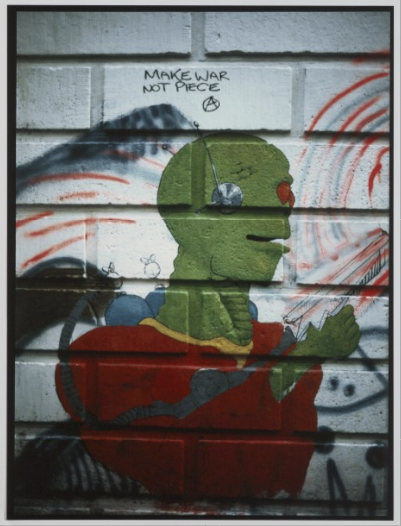

Image: archive2.png
 - CNN (ResNet) prediction: freight car
 - ViT prediction: window shade


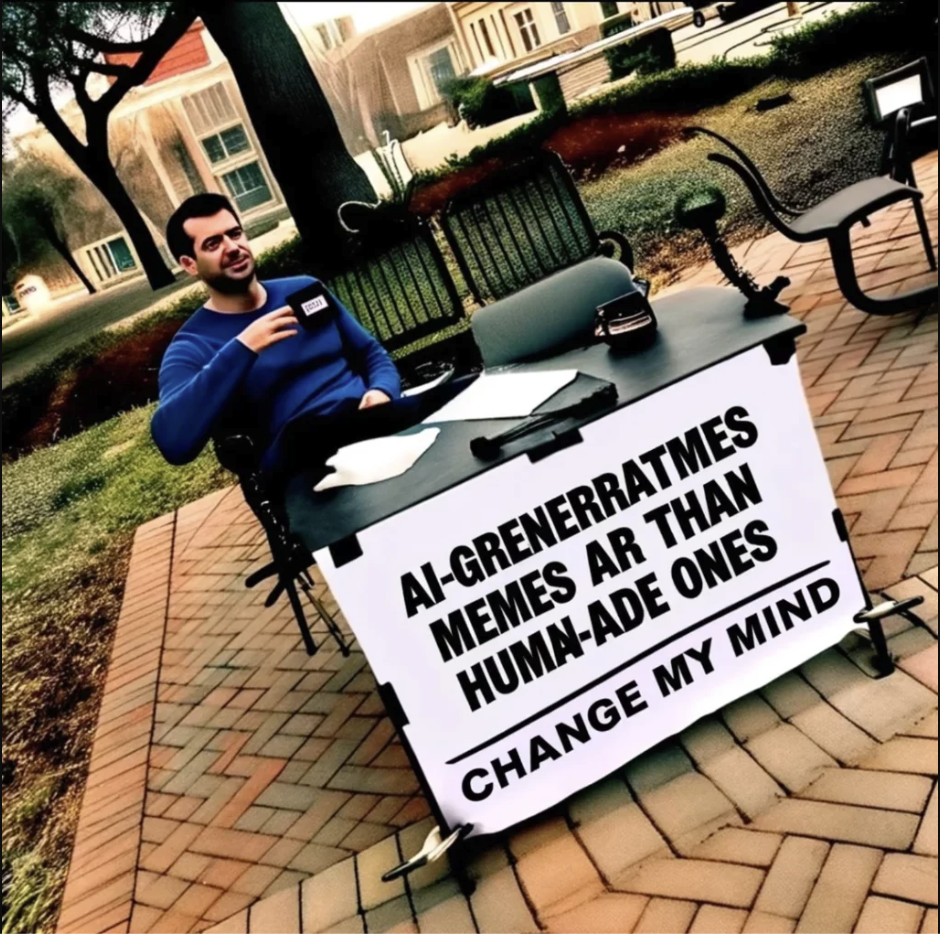

Image: meme1.png
 - CNN (ResNet) prediction: park bench
 - ViT prediction: menu


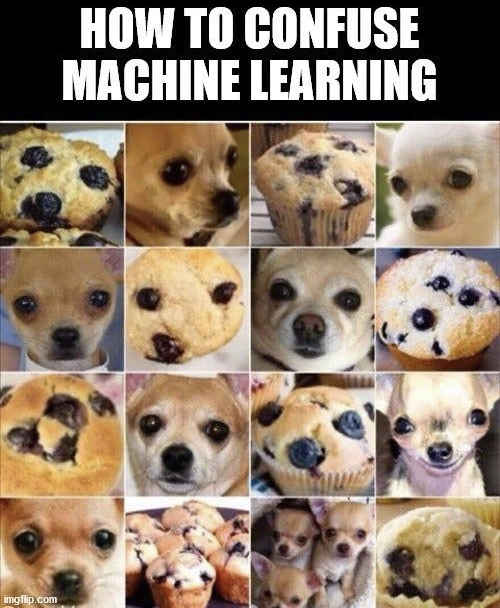

Image: meme2.png
 - CNN (ResNet) prediction: Chihuahua
 - ViT prediction: Chihuahua


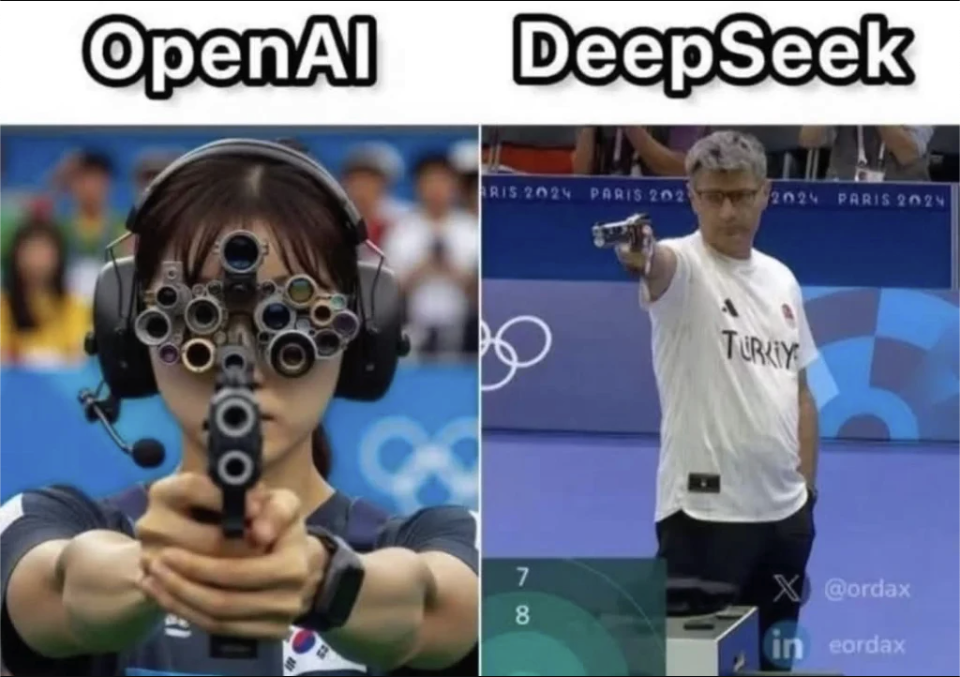

Image: meme3.png
 - CNN (ResNet) prediction: lab coat, laboratory coat
 - ViT prediction: bow


In [ ]:
# --- Classify images ---
for path in image_paths.values():
    cnn_label = classify_image(#YOUR CODE HERE
    vit_label = classify_image(#YOUR CODE HERE

    display(Image.open(path))
    print(f"Image: {path.split('/')[-1]}")
    print(f" - CNN (ResNet) prediction: {cnn_label}")
    print(f" - ViT prediction: {vit_label}")
    print("="*50)

### Object Detection

We saw that single-label predictions often don’t match our intuition for complex images like memes. Now, let’s explore object detection, which allows computers to locate and identify multiple objects within an image. Object detection is useful in cultural data analysis for tasks like:

- Understanding the composition of memes.
- Analyzing visual patterns in historical photographs.
- Detecting specific items in artworks or illustrations.

 object detection models are typically trained on large datasets:

- **COCO (Common Objects in Context)**: 80 object categories like people, animals, and everyday items. Widely used for object detection and segmentation.
- **ImageNet**: 1,000 object categories, used mostly for image classification.
- **Open Images**: A large dataset with diverse objects and annotations.

In this notebook, we’ll start by detecting objects in memes using the DETR-ResNet-50 model (facebook/detr-resnet-50), which combines a CNN backbone (ResNet-50) with a Transformer-based detection head for precise object localization and classification.

Let's try it with one of the memes.

Load the first meme using `Image.open(image_paths['meme1'])`.

Create an object detection pipeline using:
`pipeline("object-detection", model="facebook/detr-resnet-50")`

In [ ]:
# Load the meme images
pil_meme_1 = Image.open(image_paths['meme1'])

# Create the object detection pipeline with a CNN-based model
detector_cnn = pipeline("object-detection", model="facebook/detr-resnet-50")

Create a function `detect_and_display(image, model, top_k=5)` that:
1. Runs detection: `results = model(image)`
2. Sorts results by score (confidence) in descending order and takes top_k
3. Displays the image
4. Prints the top predictions with label and confidence score

Call this function on the first meme.

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2446: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/modules/module.py:2446: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

Device set to use cpu


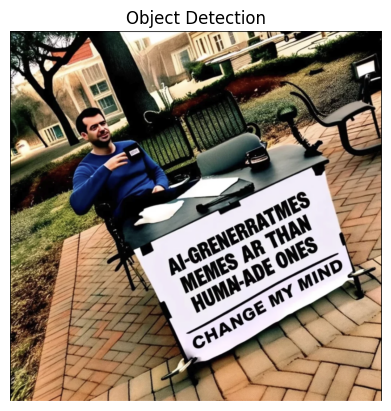

Top predictions:
person — confidence: 0.99
bench — confidence: 0.98
cell phone — confidence: 0.98
chair — confidence: 0.94
car — confidence: 0.86


In [ ]:
# Function to run detection and display results
def detect_and_display(image, model, top_k=5):
    results = #YOUR CODE HERE

    # Sort results by confidence descending
    results_sorted = #YOUR CODE HERE

    # Display image
    plt.imshow(image)
    plt.axis('off')
    plt.title("Object Detection")
    plt.show()

    # Print top predictions
    print("Top predictions:")
    for #YOUR CODE HERE
      #YOUR CODE HERE

# Run detection on the first meme
detect_and_display(pil_meme_1, detector_cnn)


#### Side Bar: Bounding Boxes and Visualizing Detected Objects

Sometimes, it's not enough to know **what objects are in an image** — we also want to know **where they are located**. This is why we use **bounding boxes**, which highlight the area of the image corresponding to each detected object. In the code below, we draw bounding boxes around the **top detected objects** in a meme. This helps us visually understand **what the model "sees"** and where it thinks each object is located.

We can now run the same object detection on other memes, but this time with **bounding boxes drawn**, to see which objects are consistently detected across images. We'll also increase the number of predictions to the **top 10**, so we can explore a wider range of objects that the model finds, including less obvious or less confident ones.


Create a function `detect_and_draw(image, model, top_k=5)` that:
1. Runs detection and sorts by confidence, keeping top_k results
2. Makes a copy of the image for drawing
3. Creates an ImageDraw object
4. Tries to load a font (with fallback to default)
5. For each detected object:
   - Extract bounding box coordinates (xmin, ymin, xmax, ymax)
   - Draw a rectangle with red outline
   - Add text label with the object name and confidence score
6. Display the annotated image
7. Print all predictions

In [ ]:
def detect_and_draw(image, model, top_k=5):
    results = #YOUR CODE HERE
    results_sorted = #YOUR CODE HERE

    # Make a copy of the image to draw on
    image_draw = #YOUR CODE HERE
    draw = ImageDraw.Draw(image_draw)

    # Optional: Use a simple font
    try:
        font = ImageFont.truetype("arial.ttf", size=16)
    except:
        font = ImageFont.load_default()

    # Draw bounding boxes and labels
    for obj in results_sorted:
        bbox = obj['box']
        x0, y0 = bbox['xmin'], bbox['ymin']
        x1, y1 = bbox['xmax'], bbox['ymax']
        draw.rectangle([x0, y0, x1, y1], outline="red", width=2)
        draw.text((x0, y0 - 12), f"{obj['label']} ({obj['score']:.2f})", fill="red", font=font)

    # Show the image
    plt.figure(figsize=(8, 8))
    plt.imshow(image_draw)
    plt.axis('off')
    plt.show()

    # Print top predictions
    print("Top predictions:")
    for obj in results_sorted:
        print(f"{obj['label']} — confidence: {obj['score']:.2f}")


Loop through all image paths and call this function with top_k=10.
Print which meme is being processed.

### Meme: archival_photo ###


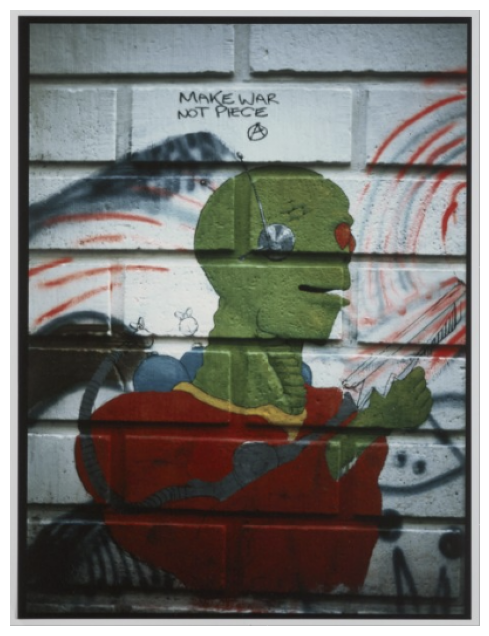

Top predictions:
### Meme: meme1 ###


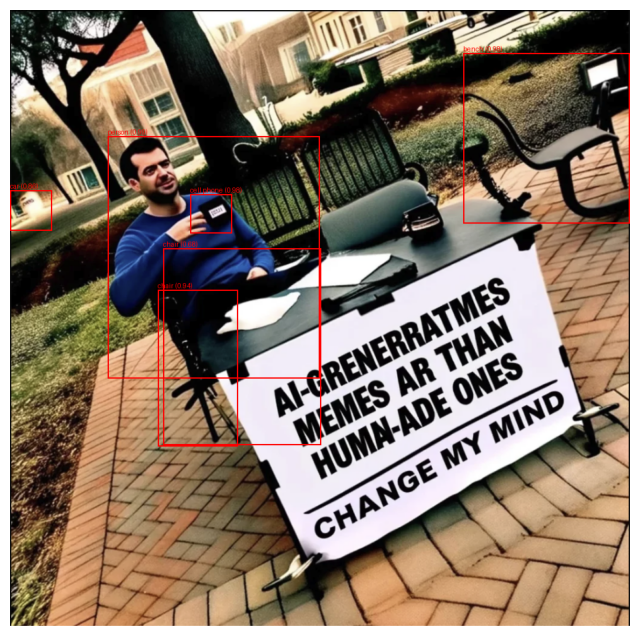

Top predictions:
person — confidence: 0.99
bench — confidence: 0.98
cell phone — confidence: 0.98
chair — confidence: 0.94
car — confidence: 0.86
chair — confidence: 0.68
### Meme: meme2 ###


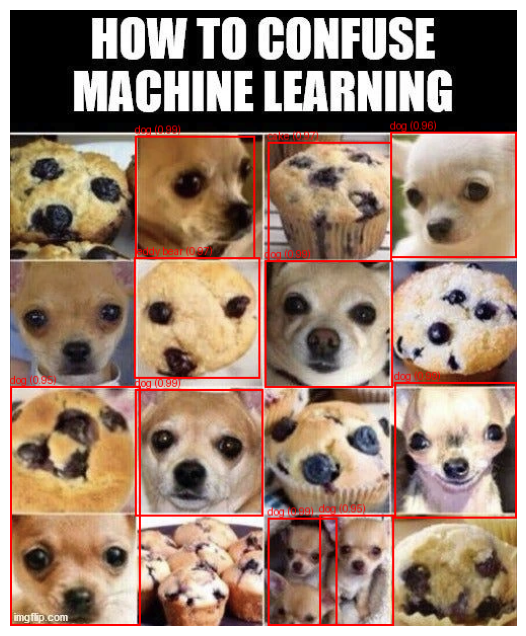

Top predictions:
dog — confidence: 0.99
dog — confidence: 0.99
dog — confidence: 0.99
dog — confidence: 0.99
dog — confidence: 0.99
teddy bear — confidence: 0.97
cake — confidence: 0.97
dog — confidence: 0.96
dog — confidence: 0.95
dog — confidence: 0.95
### Meme: meme3 ###


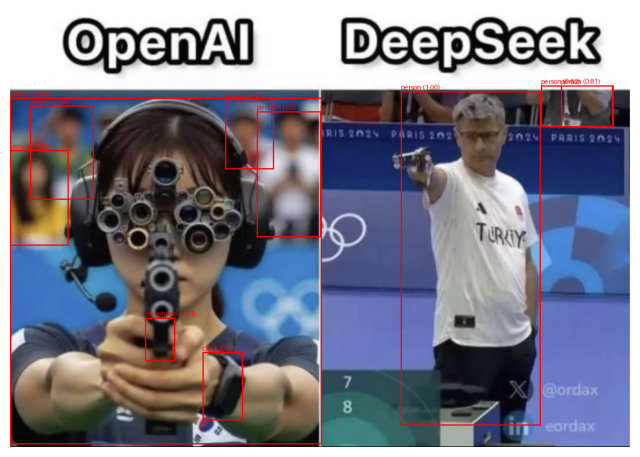

Top predictions:
person — confidence: 1.00
person — confidence: 1.00
person — confidence: 1.00
person — confidence: 0.98
person — confidence: 0.98
person — confidence: 0.98
person — confidence: 0.81
cell phone — confidence: 0.71
clock — confidence: 0.70
person — confidence: 0.62


In [ ]:
# Run detection and draw boxes for all three memes
for image_name, path in image_paths.items():
    #YOUR CODE HERE




## Summary

In this lecture, we explored:

- How computers **represent images numerically**
- Basic manipulations: resizing, cropping, grayscale, rotation
- Image filtering: blur, thresholding, edge detection
- Classical computer vision: contour detection, feature detection
- OCR: extracting text from images (Tesseract, EasyOCR)
- Deep learning for vision: CNNs and Vision Transformers
- Object detection and bounding boxes for multi-object images
- Biases and limitations of pretrained vision models

### Seminar Follow-up

Next, we will explore:

- **Computer vision for cultural heritage**: challenges with historical photographs and artwork
- **CLIP and multimodal models**
- **Vision-language models (VLMs)** and their comparison to task-specific models
